## Imports

In [1]:
import pandas as pd 
import numpy as numpy 
import itertools
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

In [2]:
df_train = pd.read_csv('nytfug/train.csv')
df_test = pd.read_csv('nytfug/test.csv')

In [3]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           60000 non-null  int64  
 1   obj_ID       60000 non-null  float64
 2   alpha        60000 non-null  float64
 3   delta        60000 non-null  float64
 4   u            60000 non-null  float64
 5   g            60000 non-null  float64
 6   r            60000 non-null  float64
 7   i            60000 non-null  float64
 8   z            60000 non-null  float64
 9   run_ID       60000 non-null  int64  
 10  cam_col      60000 non-null  int64  
 11  field_ID     60000 non-null  int64  
 12  spec_obj_ID  60000 non-null  float64
 13  redshift     60000 non-null  float64
 14  plate        60000 non-null  int64  
 15  MJD          60000 non-null  int64  
 16  fiber_ID     60000 non-null  int64  
 17  label        60000 non-null  int64  
dtypes: float64(10), int64(8)
memory usage: 8.2 MB


In [4]:
df_train.head()

,id,obj_ID,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID,label
0,0,1.237666e+18,223.818272,19.918549,20.01995,18.61652,17.81234,17.36830,17.05670,4678,3,148,3.142504e+18,0.178004,2791,54556,427,0
1,1,1.237668e+18,207.866352,21.651873,17.87874,16.72789,16.71315,16.75816,16.82370,5183,5,490,3.117752e+18,-0.000041,2769,54527,491,2
2,2,1.237679e+18,328.585779,2.229687,27.14565,22.64610,20.92246,19.83694,19.23603,7712,4,120,5.795190e+18,0.558458,5147,55854,667,0
3,3,1.237681e+18,330.900844,30.407209,23.89204,22.71284,21.21638,20.03538,19.33082,8156,4,69,6.711640e+18,-0.000103,5961,56460,549,2
4,4,1.237662e+18,250.743112,23.739861,18.41437,16.64718,15.73495,15.23219,14.81856,3926,3,178,1.592087e+18,0.030478,1414,53135,233,0


## Correlations

In [5]:
(df_train
 .loc[:, ~df_train.columns.str.contains("ID", case=False)]  # Exclude columns with "ID" in their name
 .select_dtypes(include='float')  # Select only float columns
 .corr(method='spearman')         # Compute the correlation matrix
 .style
 .background_gradient(cmap='RdBu', vmax=1, vmin=-1)  # Apply the gradient style
 .set_sticky(axis='index')        # Make the index sticky
)


,alpha,delta,u,g,r,i,z,redshift
alpha,1.000000,0.145776,-0.003724,-0.026024,-0.034845,-0.033761,-0.035144,-0.019604
delta,0.145776,1.000000,-0.029086,-0.016023,-0.003666,0.005482,0.005025,0.026425
u,-0.003724,-0.029086,1.000000,0.849255,0.686947,0.559867,0.492515,0.331751
g,-0.026024,-0.016023,0.849255,1.000000,0.906027,0.788170,0.715558,0.512629
r,-0.034845,-0.003666,0.686947,0.906027,1.000000,0.957298,0.909591,0.574835
i,-0.033761,0.005482,0.559867,0.788170,0.957298,1.000000,0.977914,0.584184
z,-0.035144,0.005025,0.492515,0.715558,0.909591,0.977914,1.000000,0.571197
redshift,-0.019604,0.026425,0.331751,0.512629,0.574835,0.584184,0.571197,1.000000


In [6]:
(df_test
 .loc[:, ~df_test.columns.str.contains("ID", case=False)]  # Exclude columns with "ID" in their name
 .select_dtypes(include='float')  # Select only float columns
 .corr(method='spearman')         # Compute the correlation matrix
 .style
 .background_gradient(cmap='RdBu', vmax=1, vmin=-1)  # Apply the gradient style
 .set_sticky(axis='index')        # Make the index sticky
)

,alpha,delta,u,g,r,i,z,redshift
alpha,1.000000,0.137192,-0.004048,-0.021172,-0.027145,-0.025446,-0.023764,-0.022401
delta,0.137192,1.000000,-0.026760,-0.011363,-0.001411,0.007058,0.007881,0.020166
u,-0.004048,-0.026760,1.000000,0.852399,0.693441,0.569675,0.502842,0.333250
g,-0.021172,-0.011363,0.852399,1.000000,0.906362,0.791329,0.720077,0.508550
r,-0.027145,-0.001411,0.693441,0.906362,1.000000,0.957943,0.910669,0.571105
i,-0.025446,0.007058,0.569675,0.791329,0.957943,1.000000,0.978220,0.580008
z,-0.023764,0.007881,0.502842,0.720077,0.910669,0.978220,1.000000,0.566427
redshift,-0.022401,0.020166,0.333250,0.508550,0.571105,0.580008,0.566427,1.000000


 **Key Observations:**
1. **Clustering of variables (`g`, `r`, `i`, `z`)**: These variables are highly correlated with each other, suggesting they may be part of a related system or process.
2. **`redshift` relationships**: Moderate positive correlations with `r`, `i`, and `z` suggest that these variables might be useful in predicting or understanding `redshift`.
3. **Independence of `alpha` and `delta`**: Both show negligible correlations with all other variables, indicating they may not be strongly tied to the same processes as the other variables.



In [7]:
(df_train
 .loc[:, ~df_train.columns.str.contains("ID", case=False)]  # Exclude columns with "ID" in their name
 .select_dtypes(include='float')  # Select only float columns
).describe()

,alpha,delta,u,g,r,i,z,redshift
count,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000
mean,177.640651,24.167426,22.081847,20.634154,19.647139,19.084174,18.766999,0.572290
std,96.306336,19.627278,2.242605,2.032654,1.852571,1.757359,1.765328,0.720926
min,0.005528,-17.636198,12.101680,10.498200,10.068540,10.008650,10.225510,-0.006863
25%,127.422243,5.202371,20.362378,18.979680,18.137935,17.736297,17.457700,0.054484
50%,180.923193,23.738695,22.177225,21.101585,20.128650,19.402305,19.003570,0.423660
75%,233.835800,39.927478,23.672880,22.125912,21.042817,20.391340,19.919277,0.702112
max,359.999810,83.000519,29.234380,31.602240,29.571860,32.141470,29.383740,7.011245


In [8]:
(df_test
 .loc[:, ~df_test.columns.str.contains("ID", case=False)]  # Exclude columns with "ID" in their name
 .select_dtypes(include='float')  # Select only float columns
).describe()

,alpha,delta,u,g,r,i,z,redshift
count,27998.000000,27998.000000,27998.000000,27998.000000,27998.000000,27998.000000,27998.000000,27998.000000
mean,177.798616,24.171815,22.064213,20.619536,19.636474,19.080522,18.768341,0.582743
std,96.762804,19.635612,2.261891,2.048807,1.861580,1.761986,1.771363,0.749707
min,0.013337,-17.613056,12.303490,10.671800,10.194600,10.055090,10.650560,-0.009971
25%,127.742788,5.175357,20.325525,18.933073,18.123313,17.711820,17.440362,0.053136
50%,181.251015,23.744146,22.167390,21.089565,20.117800,19.409500,19.010525,0.422904
75%,234.030550,39.894852,23.693058,22.118030,21.045063,20.396570,19.922250,0.705778
max,359.999031,82.764421,32.781390,27.347720,27.626880,27.503400,26.130110,7.011245


 **Key Insights**:
1. The **alpha** and **delta** columns capture celestial coordinates, showing a wide spatial distribution across the sky.
2. The **magnitude values** suggest a broad range of object brightness, with most clustering in a central range. Each band differs slightly, reflecting the nature of their respective wavelengths.
3. The **redshift values** highlight a predominantly local dataset, with a few extreme outliers suggesting distant astronomical objects.
4. Similar values in test set

## Scatter plot analysis 

In [9]:
def create_scatter_plots(column1, column2):
    """
    Creates scatter plots for the specified columns from global DataFrames `df_train` and `df_test`.

    Parameters:
        column1 (str): The name of the first column (x-axis).
        column2 (str): The name of the second column (y-axis).

    Returns:
        None
    """
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Scatter plot for df_train
    axes[0].scatter(df_train[column1], df_train[column2], color='blue', alpha=0.2)
    axes[0].set_title('df_train Scatter Plot')
    axes[0].set_xlabel(column1)
    axes[0].set_ylabel(column2)

    # Scatter plot for df_test
    axes[1].scatter(df_test[column1], df_test[column2], color='green', alpha=0.2)
    axes[1].set_title('df_test Scatter Plot')
    axes[1].set_xlabel(column1)
    axes[1].set_ylabel(column2)

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

In [10]:
float_columns = (df_test
           .loc[:, ~df_test.columns.str.contains("ID", case=False)]  
           .select_dtypes(include='float')
          ).columns.tolist()

In [11]:
float_pairs = list(itertools.combinations(float_columns, 2))

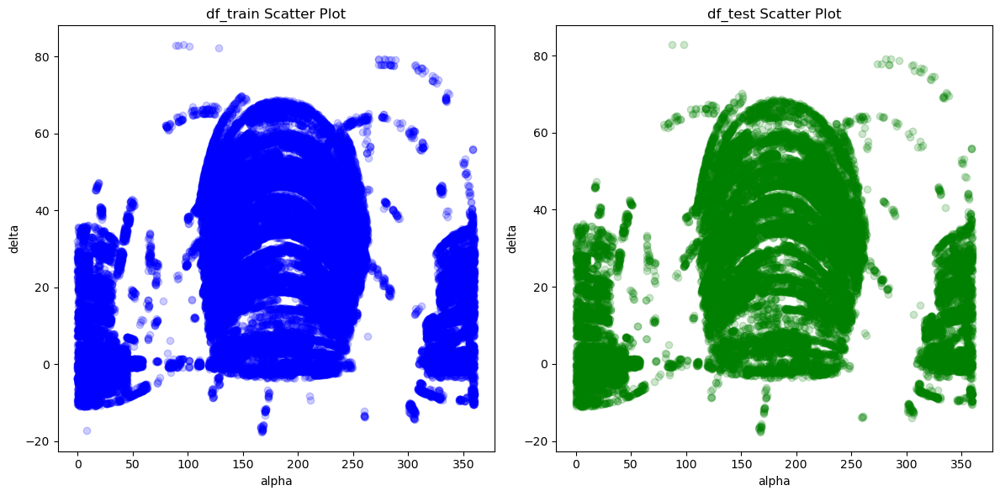

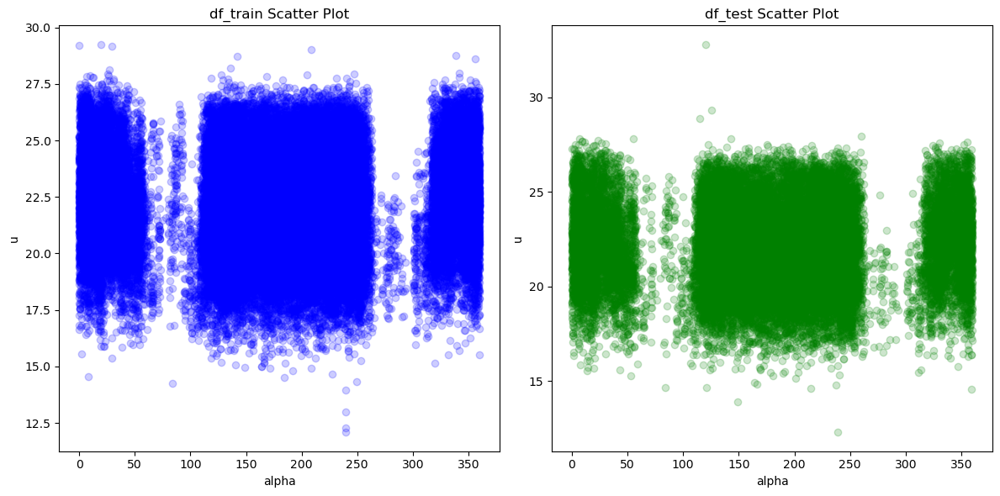

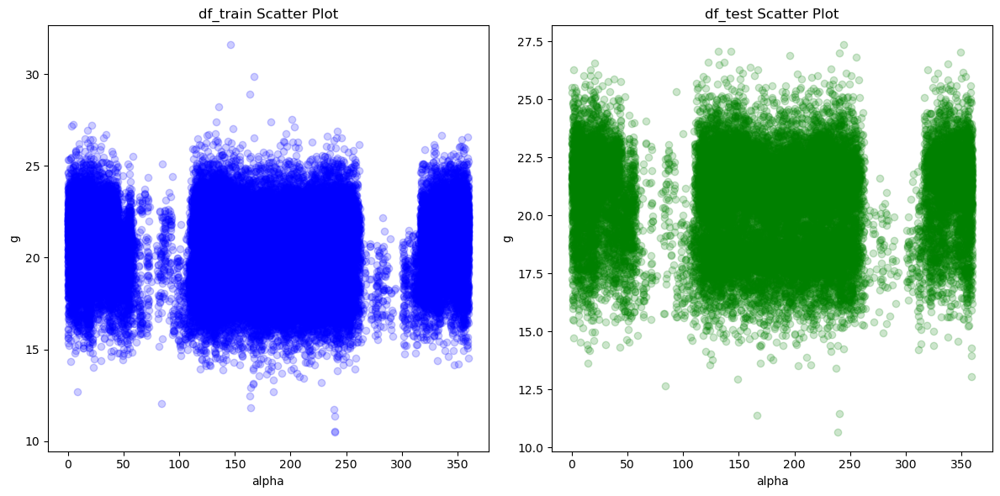

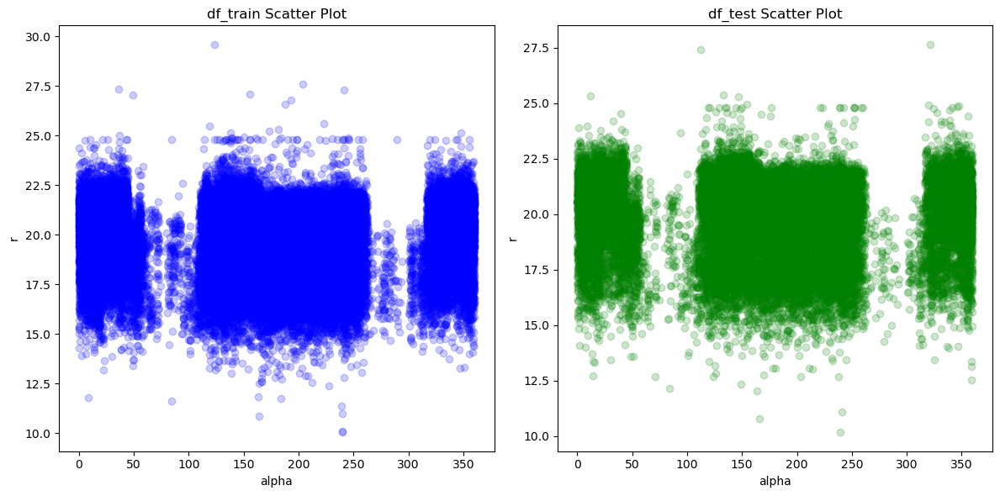

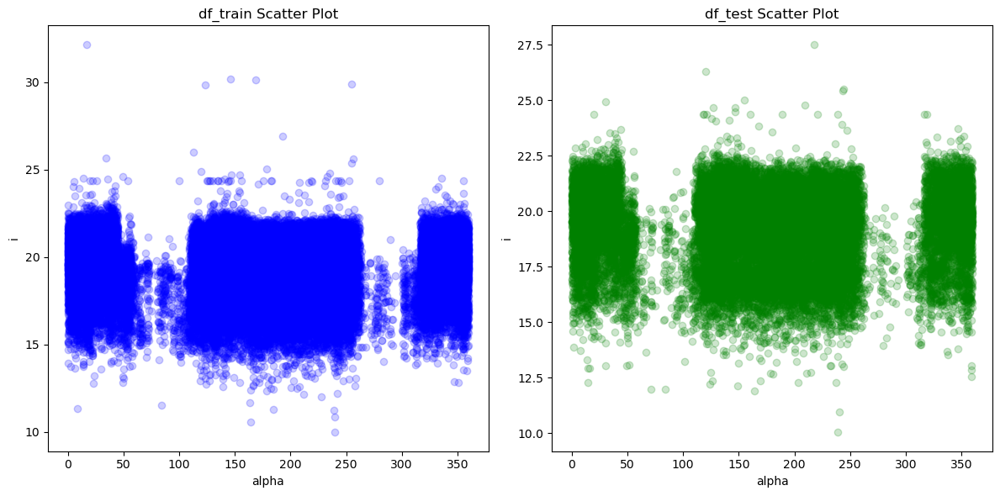

...

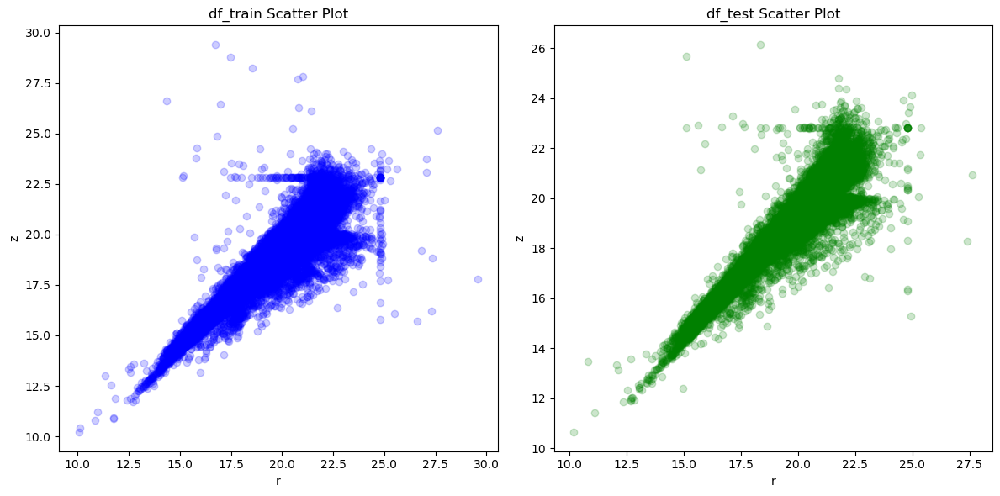

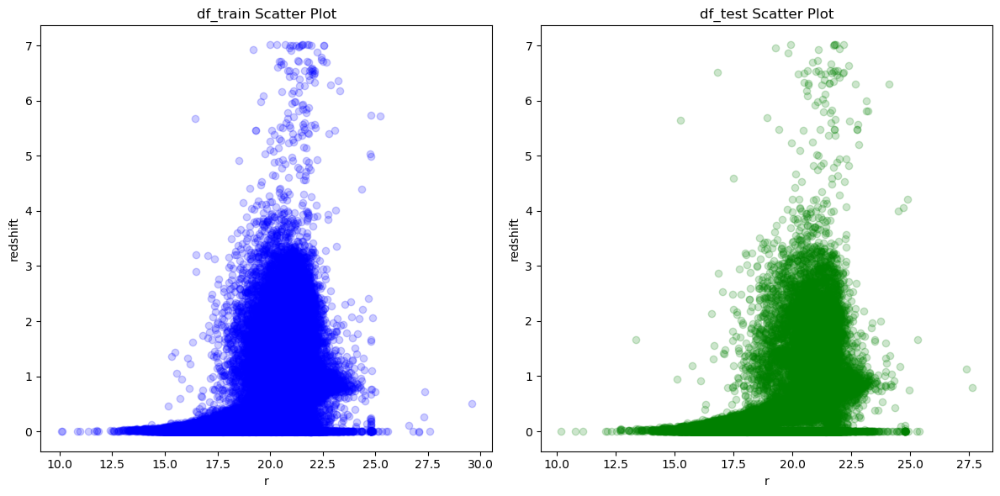

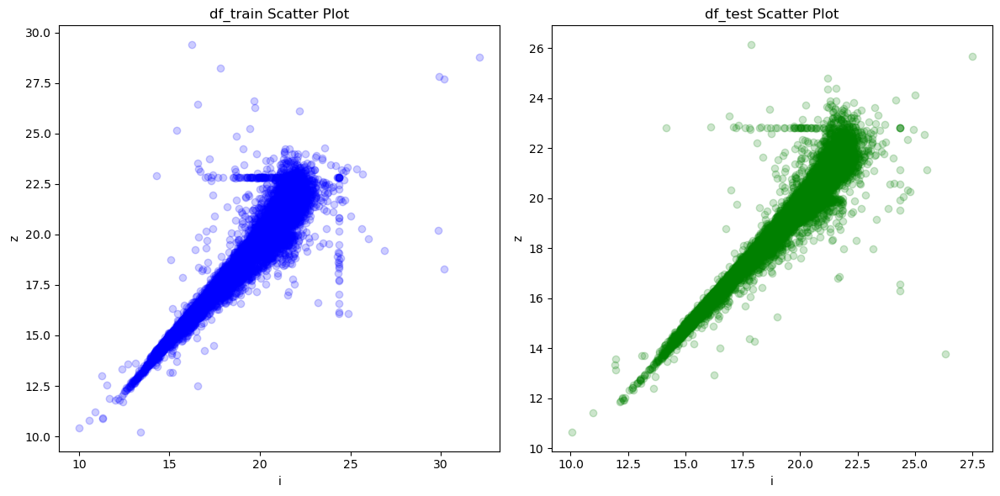

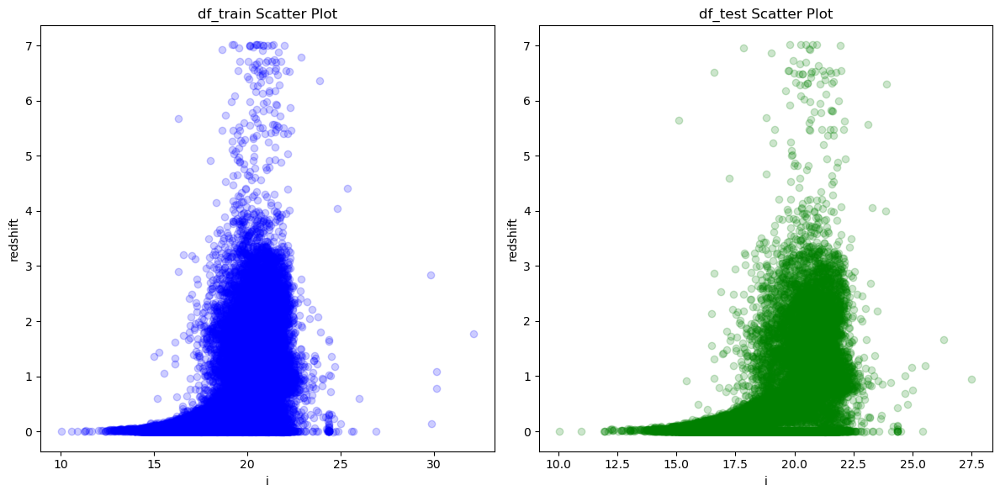

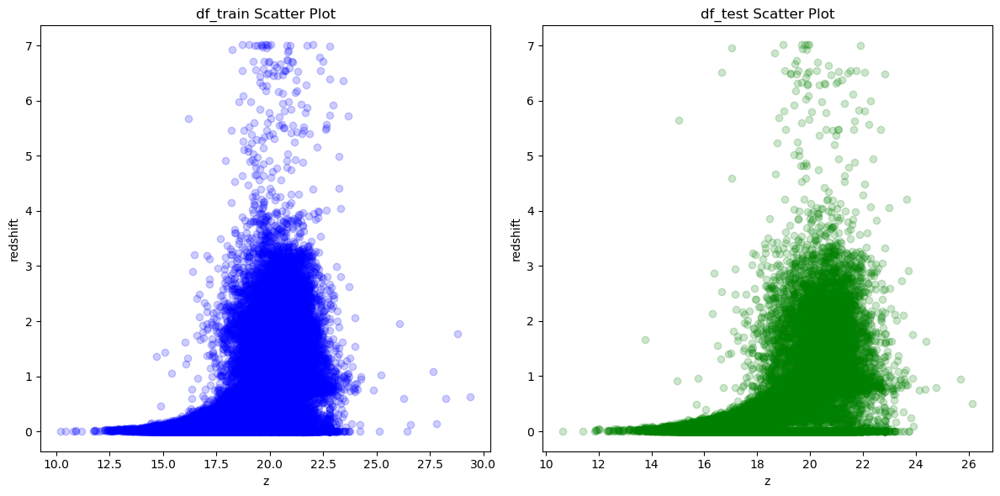

In [12]:
for pair in float_pairs:
    create_scatter_plots(pair[0], pair[1])

In [13]:
def create_hexbin_plots(column1, column2):
    """
    Creates Hexagonal bin plots for `df_train` and `df_test` and displays them side by side.

    Args:
        df_train (DataFrame): The training DataFrame.
        df_test (DataFrame): The testing DataFrame.
        column1 (str): The name of the column to use as x-axis.
        column2 (str): The name of the column to use as y-axis.
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    # Hexbin plot for df_train
    axes[0].hexbin(df_train[column1], df_train[column2], gridsize=30, cmap='Blues')
    axes[0].set_title('Hexbin Plot - df_train')
    axes[0].set_xlabel(column1)
    axes[0].set_ylabel(column2)

    # Hexbin plot for df_test
    axes[1].hexbin(df_test[column1], df_test[column2], gridsize=30, cmap='Greens')
    axes[1].set_title('Hexbin Plot - df_test')
    axes[1].set_xlabel(column1)
    axes[1].set_ylabel(column2)

    plt.tight_layout()
    plt.show()


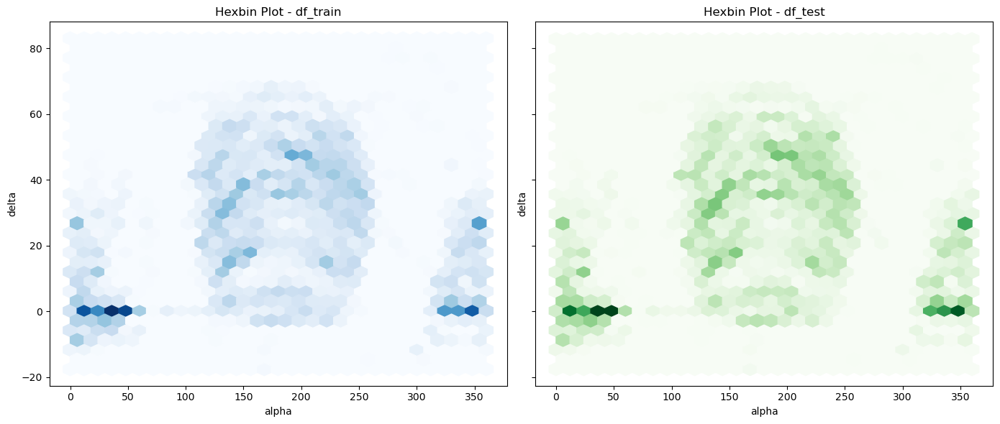

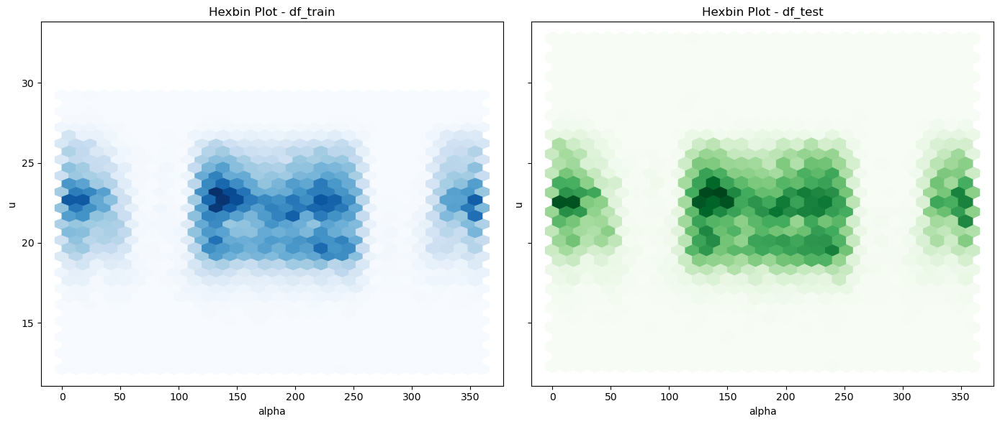

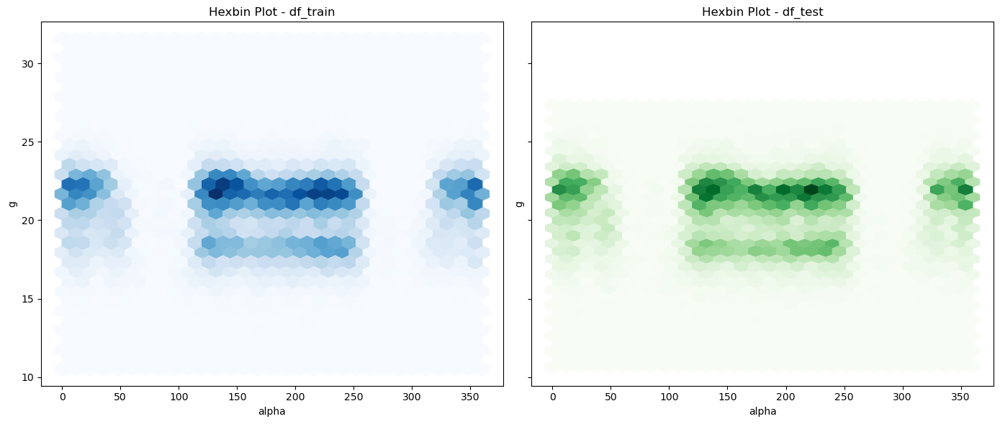

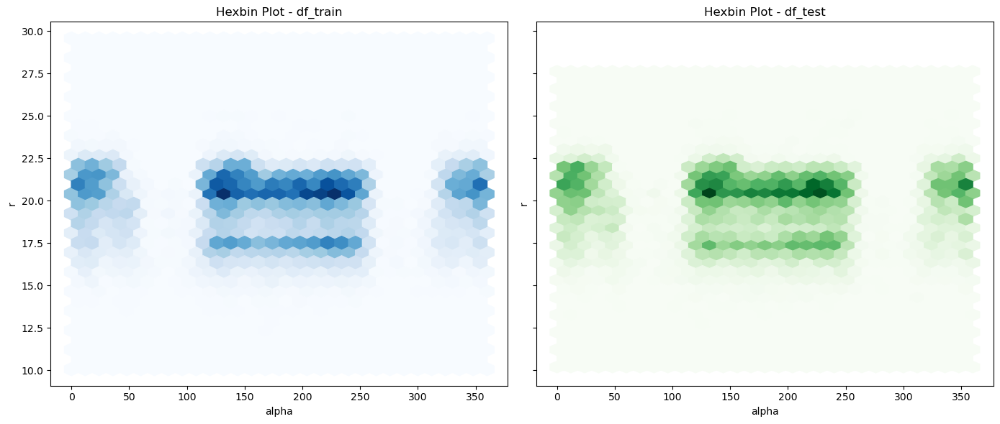

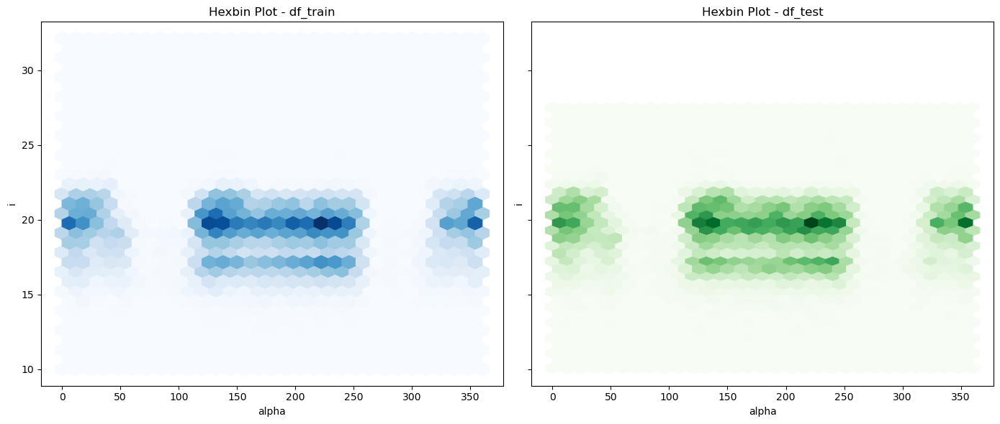

...

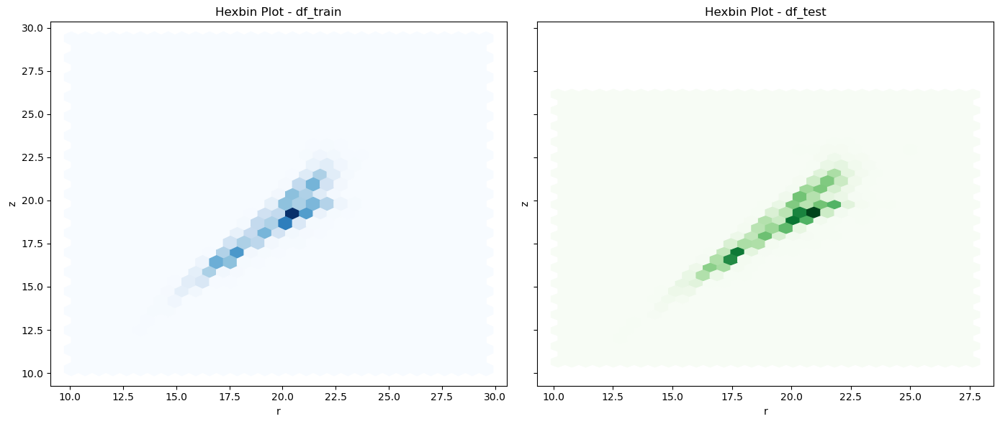

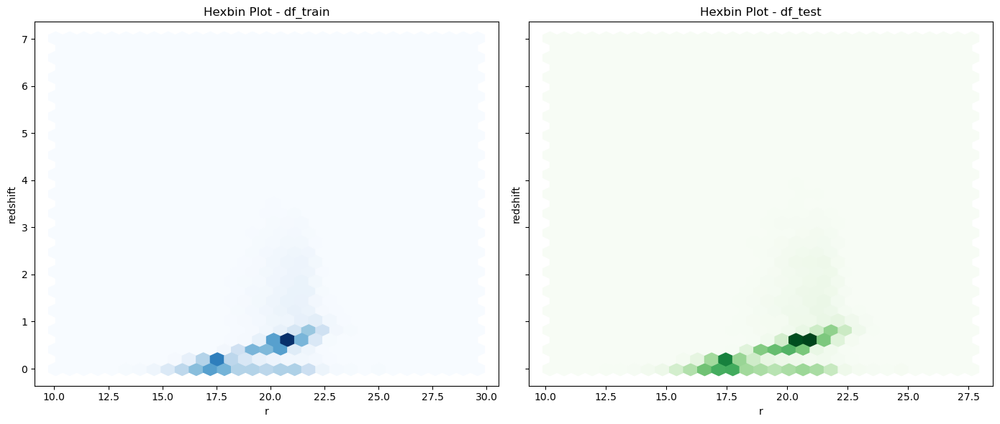

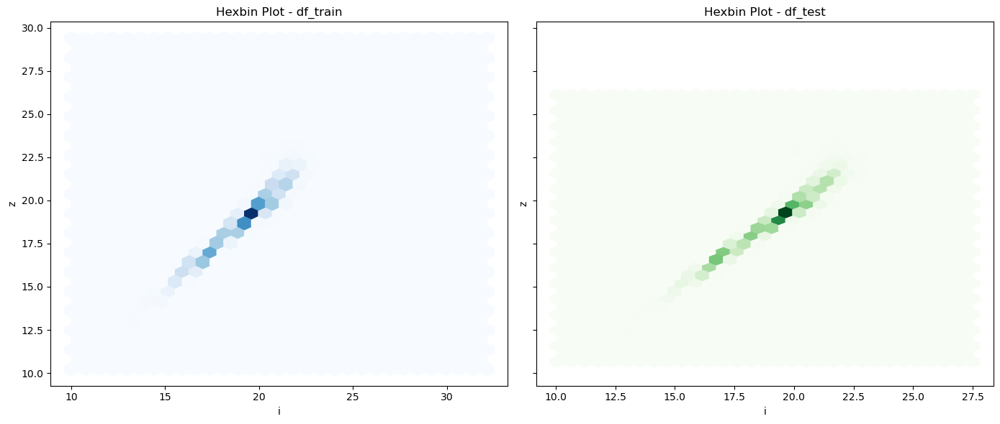

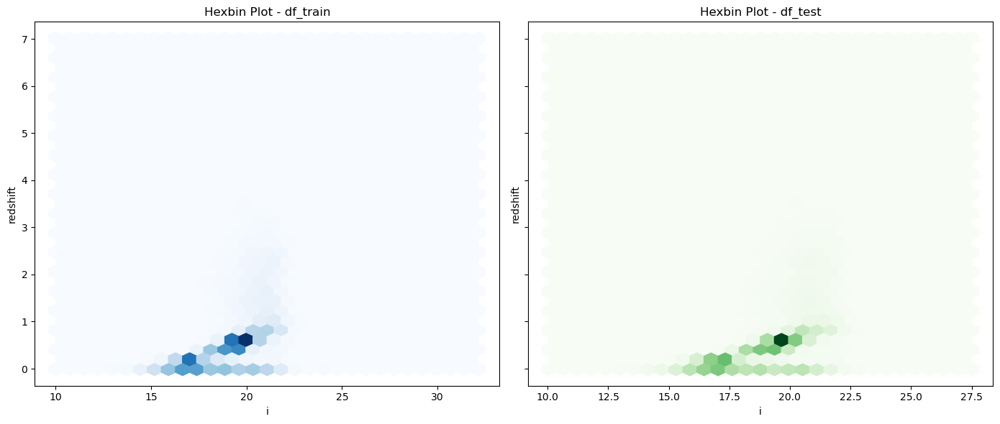

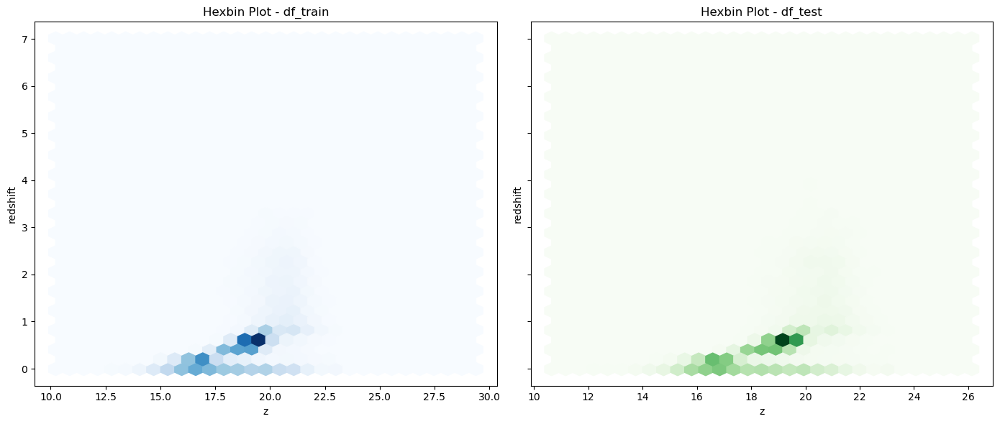

In [14]:
for pair in float_pairs:
    create_hexbin_plots(pair[0], pair[1])

## Distribution plots 

In [15]:
def plot_histograms(column_name):
    """
    Plots histograms for the given column from df_train and df_test side by side.
    
    Parameters:
    column_name (str): The name of the column to plot.
    """

    # Create subplots for side-by-side comparison
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    
    # Plot histogram for df_train
    axes[0].hist(df_train[column_name].dropna(), bins=30, color='blue', alpha=0.7)
    axes[0].set_title(f'{column_name} - Train Data')
    axes[0].set_xlabel(column_name)
    axes[0].set_ylabel('Frequency')
    
    # Plot histogram for df_test
    axes[1].hist(df_test[column_name].dropna(), bins=30, color='orange', alpha=0.7)
    axes[1].set_title(f'{column_name} - Test Data')
    axes[1].set_xlabel(column_name)
    
    plt.tight_layout()
    plt.show()


In [16]:
def plot_kde(column_name):
    """
    Plots KDEs for the given column from df_train and df_test side by side.
    
    Parameters:
    column_name (str): The name of the column to plot.
    """
    global df_train, df_test

    # Create subplots for side-by-side comparison
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    
    # Plot KDE for df_train
    sns.kdeplot(df_train[column_name].dropna(), ax=axes[0], fill=True, color='blue')
    axes[0].set_title(f'{column_name} - Train Data')
    axes[0].set_xlabel(column_name)
    axes[0].set_ylabel('Density')
    
    # Plot KDE for df_test
    sns.kdeplot(df_test[column_name].dropna(), ax=axes[1], fill=True, color='orange')
    axes[1].set_title(f'{column_name} - Test Data')
    axes[1].set_xlabel(column_name)
    
    plt.tight_layout()
    plt.show()


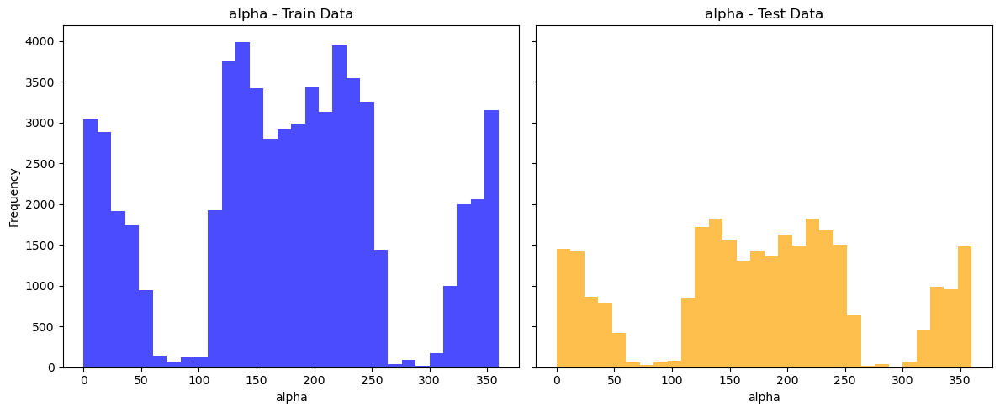

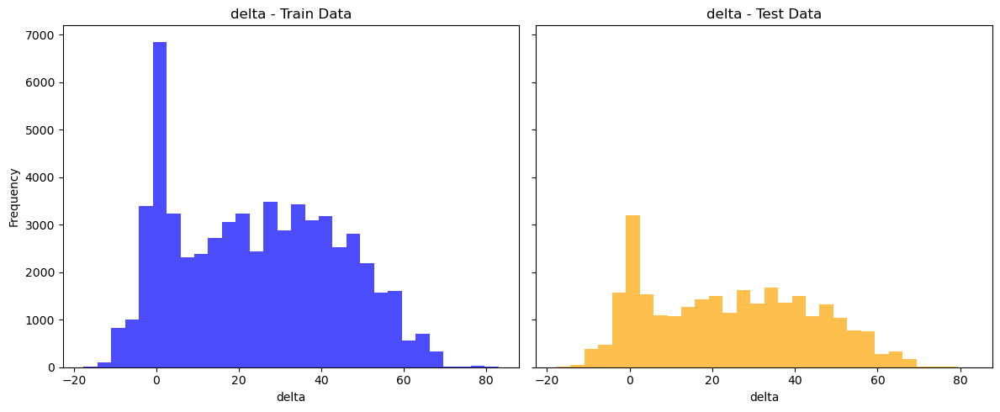

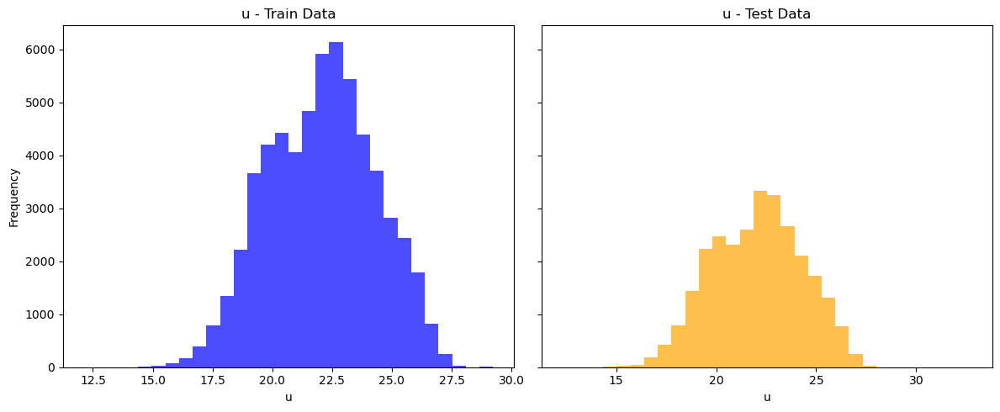

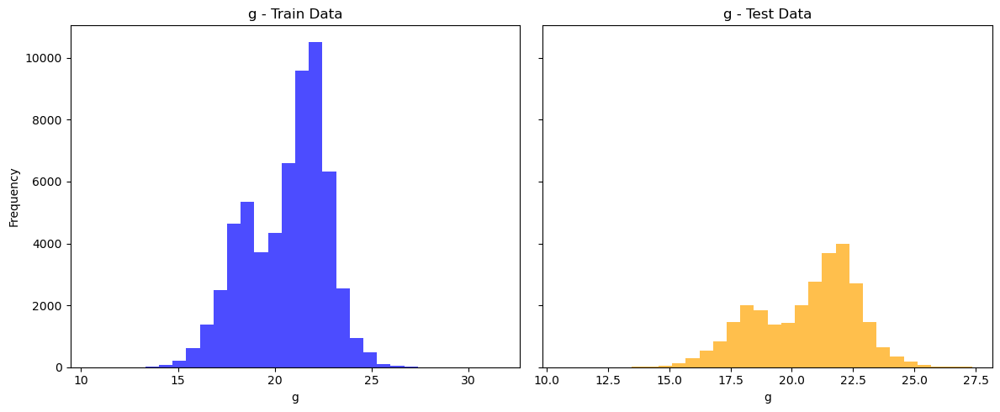

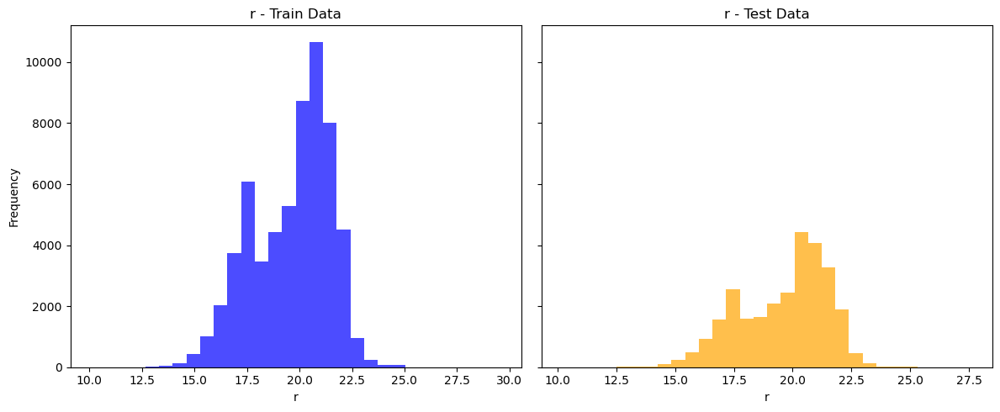

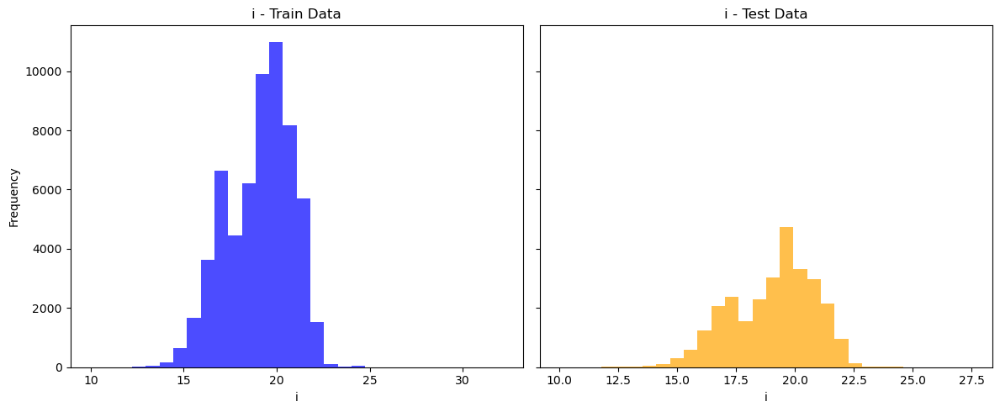

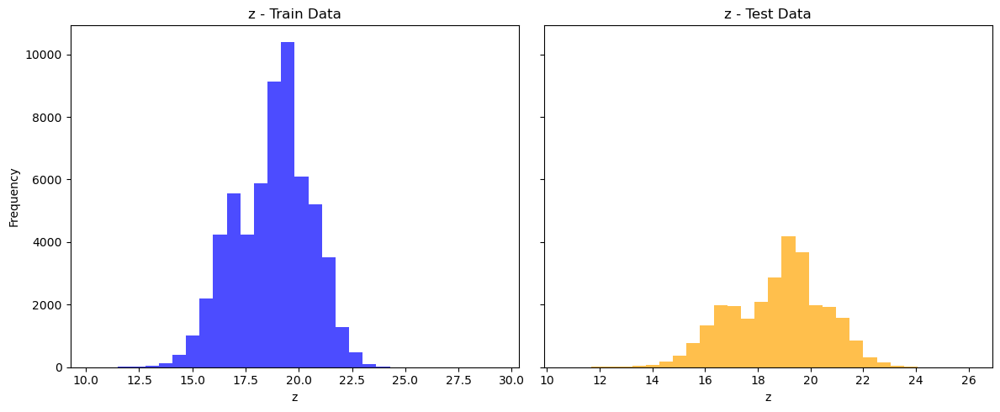

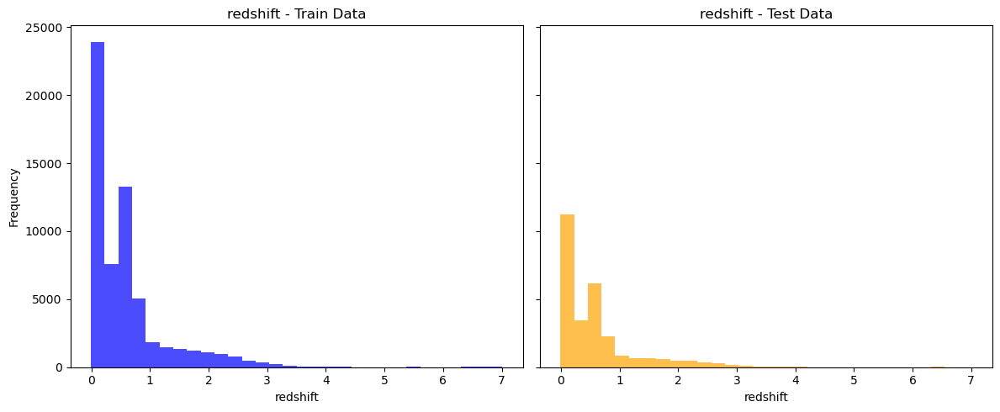

In [17]:
for column in float_columns:
    plot_histograms(column)

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


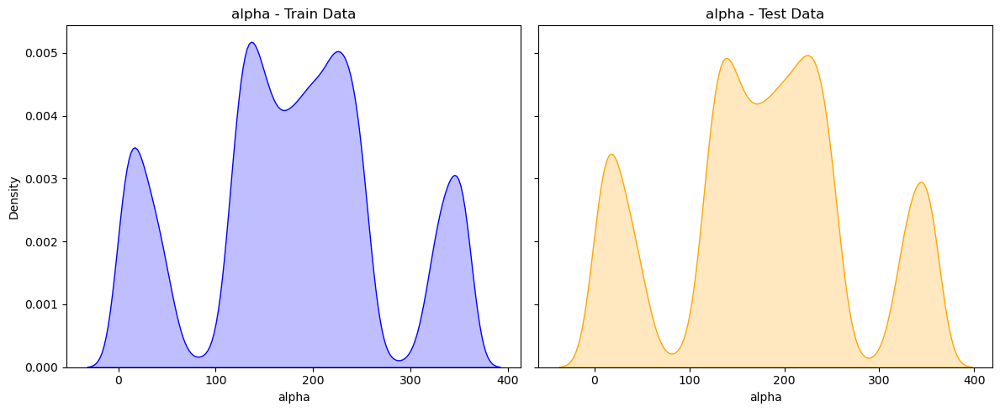

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


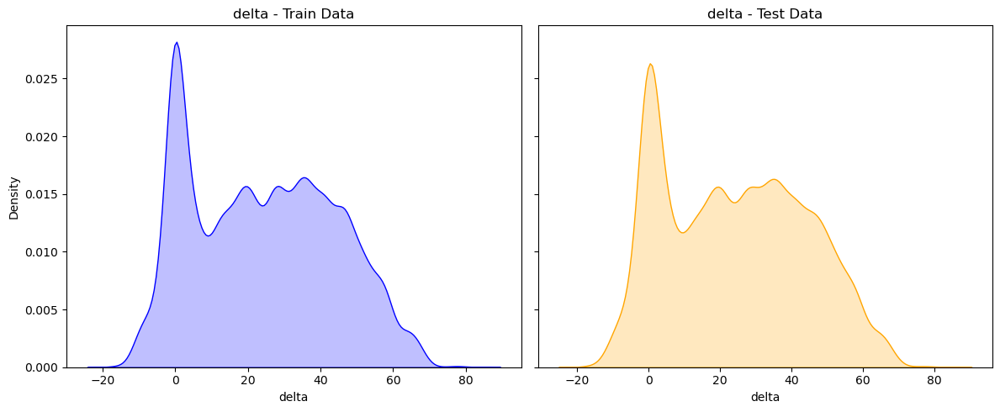

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


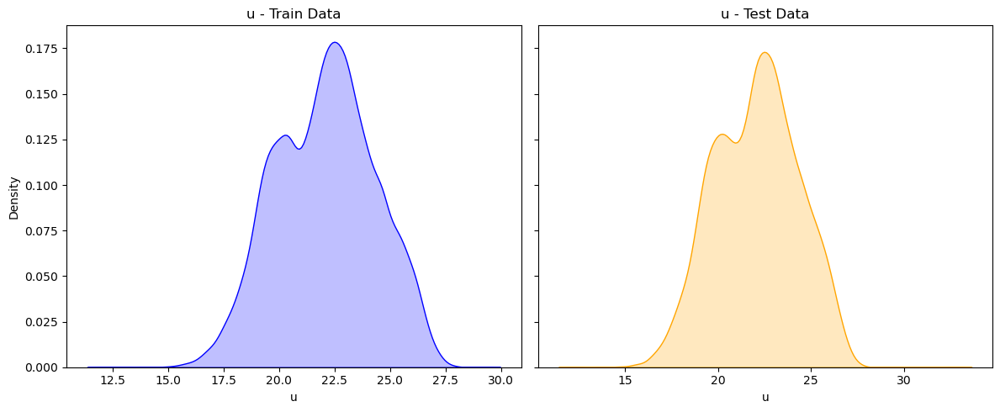

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


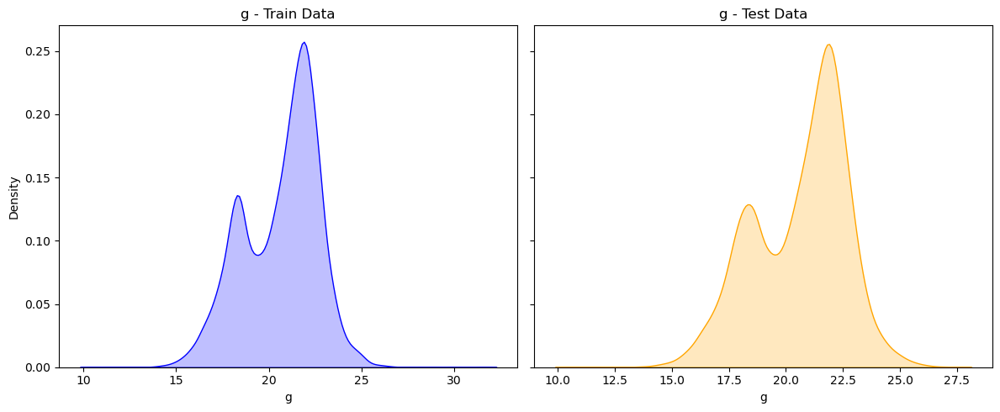

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


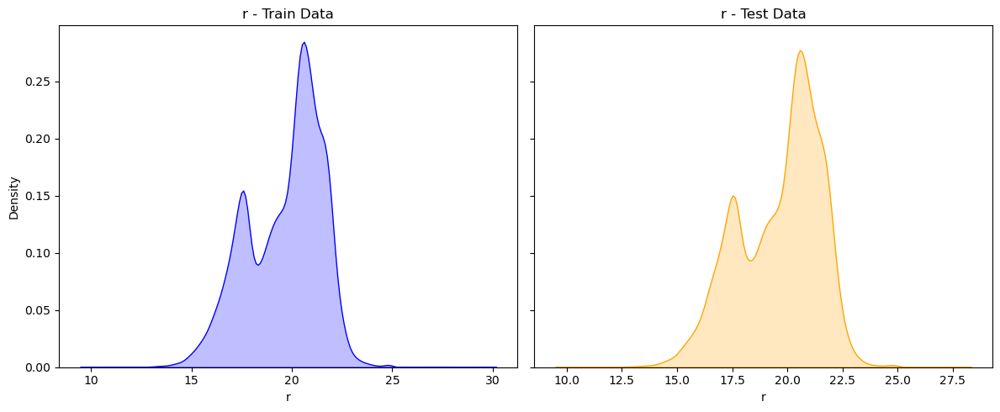

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


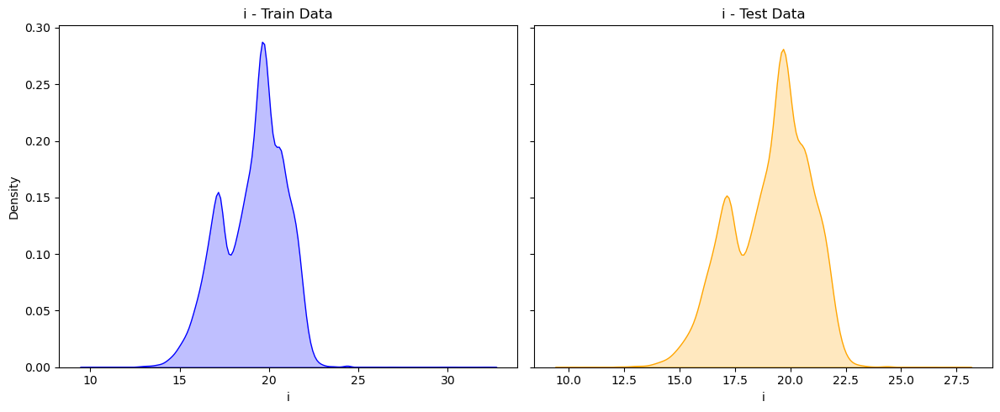

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


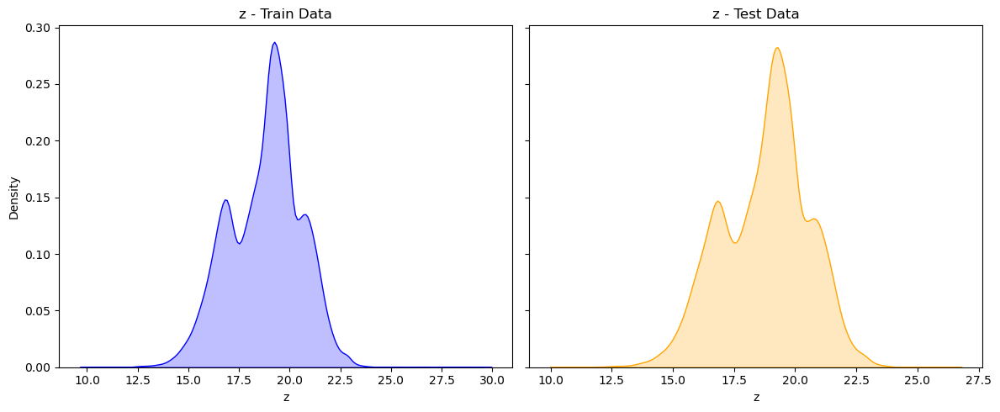

/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ric_carollo/opt/anaconda3/envs/taxi_project/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


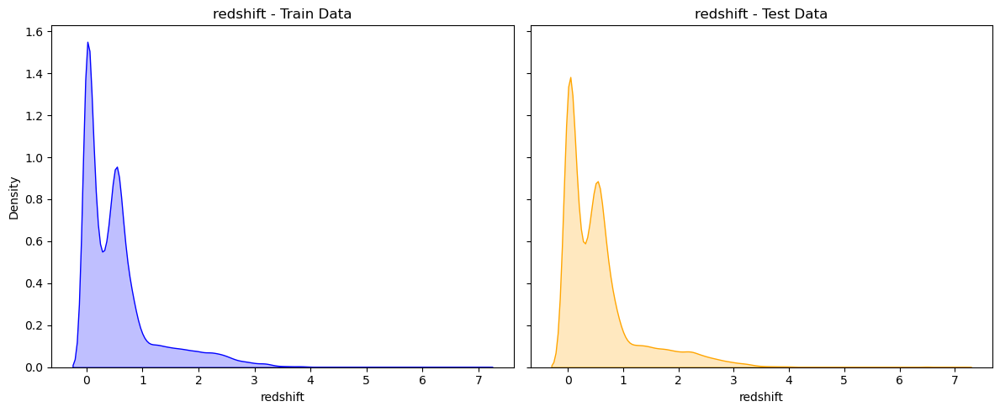

In [18]:
for column in float_columns:
    plot_kde(column)

In [19]:
float_columns

['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'redshift']

## PCA and 2D visualisation

In [20]:
pipeline_PCA = Pipeline([
    ('standardise', StandardScaler()), 
    ('reduce', PCA(n_components = 2))
])

df_train_PCA = pd.DataFrame(data = pipeline_PCA.fit_transform(df_train[float_columns]), columns = ['first_component', 'second_component'])

In [21]:
df_test_PCA = pd.DataFrame(data = pipeline_PCA.transform(df_test[float_columns]), columns = ['first_component', 'second_component'])

In [22]:
pipeline_PCA.named_steps['reduce'].explained_variance_ratio_ 

array([0.56199611, 0.14329963])

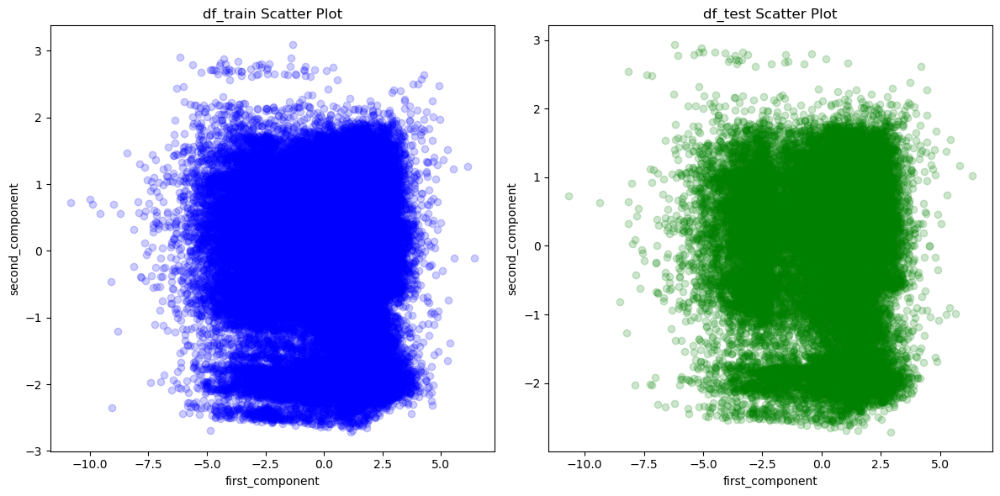

In [23]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Scatter plot for df_train
axes[0].scatter(df_train_PCA['first_component'], df_train_PCA['second_component'], color='blue', alpha=0.2)
axes[0].set_title('df_train Scatter Plot')
axes[0].set_xlabel('first_component')
axes[0].set_ylabel('second_component')

# Scatter plot for df_test
axes[1].scatter(df_test_PCA['first_component'], df_test_PCA['second_component'], color='green', alpha=0.2)
axes[1].set_title('df_test Scatter Plot')
axes[1].set_xlabel('first_component')
axes[1].set_ylabel('second_component')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

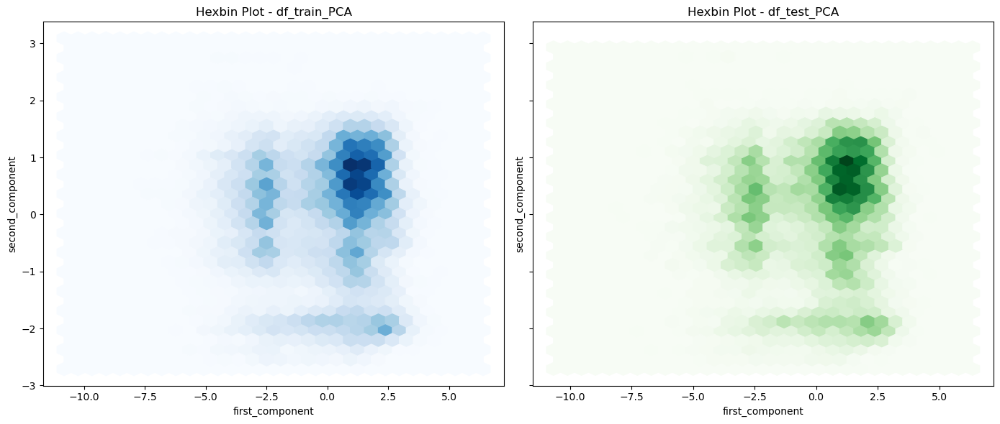

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Hexbin plot for df_train_PCA
axes[0].hexbin(df_train_PCA['first_component'], df_train_PCA['second_component'], gridsize=30, cmap='Blues')
axes[0].set_title('Hexbin Plot - df_train_PCA')
axes[0].set_xlabel('first_component')
axes[0].set_ylabel('second_component')

# Hexbin plot for df_test_PCA
axes[1].hexbin(df_test_PCA['first_component'], df_test_PCA['second_component'], gridsize=30, cmap='Greens')
axes[1].set_title('Hexbin Plot - df_test_PCA')
axes[1].set_xlabel('first_component')
axes[1].set_ylabel('second_component')

plt.tight_layout()
plt.show()

# ID columns 

In [25]:
df_train.columns

Index(['id', 'obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'cam_col', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD',
       'fiber_ID', 'label'],
      dtype='object')

In [26]:
columns = df_test.columns.tolist()

In [27]:
columns = df_test.columns.tolist()
other_columns = [x for x in columns if x not in float_columns]

In [28]:
df_train[other_columns].head()

,id,obj_ID,run_ID,cam_col,field_ID,spec_obj_ID,plate,MJD,fiber_ID
0,0,1.237666e+18,4678,3,148,3.142504e+18,2791,54556,427
1,1,1.237668e+18,5183,5,490,3.117752e+18,2769,54527,491
2,2,1.237679e+18,7712,4,120,5.795190e+18,5147,55854,667
3,3,1.237681e+18,8156,4,69,6.711640e+18,5961,56460,549
4,4,1.237662e+18,3926,3,178,1.592087e+18,1414,53135,233


In [29]:
df_train[other_columns].describe()

,id,obj_ID,run_ID,cam_col,field_ID,spec_obj_ID,plate,MJD,fiber_ID
count,60000.000000,6.000000e+04,60000.000000,60000.000000,60000.000000,6.000000e+04,60000.000000,60000.000000,60000.000000
mean,29999.500000,1.237665e+18,4479.715417,3.513033,186.294033,5.781494e+18,5134.888367,55586.838383,450.099300
std,17320.652413,8.417137e+12,1959.777049,1.586192,149.385238,3.326983e+18,2954.938658,1809.459010,271.771331
min,0.000000,1.237646e+18,109.000000,1.000000,11.000000,2.995793e+17,266.000000,51608.000000,1.000000
25%,14999.750000,1.237659e+18,3187.000000,2.000000,82.000000,2.844110e+18,2526.000000,54234.000000,223.000000
50%,29999.500000,1.237663e+18,4188.000000,4.000000,147.000000,5.611570e+18,4984.000000,55869.000000,434.000000
75%,44999.250000,1.237668e+18,5326.000000,5.000000,241.000000,8.330723e+18,7399.000000,56776.000000,646.000000
max,59999.000000,1.237681e+18,8162.000000,6.000000,989.000000,1.412694e+19,12547.000000,58932.000000,1000.000000


In [30]:
df_test[other_columns].describe()

,id,obj_ID,run_ID,cam_col,field_ID,spec_obj_ID,plate,MJD,fiber_ID
count,27998.000000,2.799800e+04,27998.000000,27998.000000,27998.000000,2.799800e+04,27998.000000,27998.000000,27998.000000
mean,13998.500000,1.237665e+18,4489.587185,3.510072,185.867598,5.787099e+18,5139.866526,55590.882527,448.097650
std,8082.470755,8.477312e+12,1973.786190,1.588758,148.453214,3.324992e+18,2953.170187,1807.740760,273.590736
min,0.000000,1.237646e+18,109.000000,1.000000,11.000000,2.996455e+17,266.000000,51608.000000,1.000000
25%,6999.250000,1.237659e+18,3187.000000,2.000000,82.000000,2.843028e+18,2525.000000,54234.000000,218.000000
50%,13998.500000,1.237663e+18,4188.000000,4.000000,145.000000,5.606016e+18,4979.000000,55865.000000,431.000000
75%,20997.750000,1.237668e+18,5327.000000,5.000000,241.000000,8.336235e+18,7404.000000,56779.250000,644.000000
max,27997.000000,1.237681e+18,8162.000000,6.000000,989.000000,1.412684e+19,12547.000000,58932.000000,1000.000000


 **Key Observations**:
- Both datasets exhibit high cardinality in columns like `obj_ID` and `spec_obj_ID`, indicating a unique identifier for nearly every observation.
- `cam_col` and `field_ID` exhibit discrete and categorical-like behaviour, making them potentially useful for grouping or filtering.
- The continuous columns like `MJD` and `fiber_ID` display smooth distributions without evident anomalies or skewness.

In [34]:
X_train, X_eval = train_test_split(
    df_train,
    test_size=0.2,
    random_state=42,
    stratify = df_train['label']
)

In [35]:
X_train.to_csv('X_train.csv', index=False)
X_eval.to_csv('X_eval.csv', index=False)